## Steps:

Check audio format >> done
Convert to wav >> done

    Find chorus, bridges and verses (read autocorrelation)
    
                break into parts:
                Silence based:
                    #Major parts of songs sliced based on length of silence
                    if Db < 35 and silence_length > 3 sec(check distribution, for set of songs)
                Beat based:
                    Break silence based snippets into instruments
                    Check each instruments plot and break on bpm change of each snippet>> join snippets together on BPM
                    for BPM in BPM:
                        BPM
                        Instruments
                        scale
                        instrument scale
                        snippet in BPM (based on scale change)>> autocorrelation >> break into rhythm

                        for Instruments = 
        

In [1]:
import librosa
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Audio
from librosa import display
import numpy as np
import os

from pathlib import Path

from pydub import AudioSegment


import mir_eval

In [5]:
data_folder = Path("E:/DS/Projects/tunes_repo/MIRaGE/Song_repo/")

## Convert Mp3 to Wav

In [6]:
Nirvana_music_list = os.listdir(data_folder / 'Mirage_wav')

In [14]:
nirvana_folder = "E:/DS/Projects/tunes/Song_repo/Nirvana"
nirvana_wav = "E:/DS/Projects/tunes_repo/MIRaGE/Song_repo/Mirage_wav"

In [9]:
music_folder = data_folder / 'Mirage_wav'

In [277]:
curr_track = nirvana_wav + "/" + str(Nirvana_music_list[9])

In [278]:
curr_track

'E:/DS/Projects/tunes_repo/MIRaGE/Song_repo/Mirage_wav/Black sabbath_war pigs_heavy_metal.black_metal.classic_metal.wav'

In [350]:
y, sr = librosa.load(curr_track)

In [309]:
from song_breaker import song_break

song = song_break(1)

2625.029835845947


E:\DS\Projects\tunes_repo\MIRaGE\Code_repo\song_breaker.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  "        else:\n",


In [308]:
song

,corr_mean,section
0,23847.641309,Intro
1,25135.653906,Chorus
2,23273.672461,Intro
3,24250.034180,Intro
4,23431.010156,Intro
5,22433.540137,Intro
6,24745.272949,Intro
7,24324.651367,Intro
8,11990.245605,Intro


In [352]:
z

array([-0.05760398, -0.08806334, -0.05904598, ..., -0.21245791,
       -0.23342402, -0.21251717], dtype=float32)

In [355]:
z = y[sr*20:(sr*20)+3150]

In [356]:
chroma = librosa.feature.chroma_cqt(z)

In [345]:
chroma[11]

array([0.36833902, 0.20202869, 0.18710253, 0.17230934, 0.16864341,
       0.18010049])

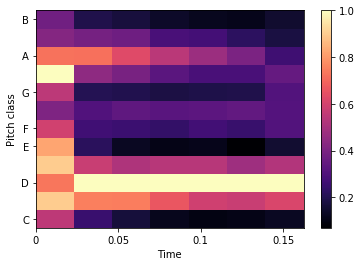

In [357]:
librosa.display.specshow(chroma, x_axis = 'time', y_axis = 'chroma')
plt.colorbar()

In [280]:
len(y)

10466817

In [281]:
rs = []

for i in range(0,len(y), sr*20):
    x = y[i:i+(sr*20)]
    rso = []
    for j in range(0,len(y), sr*20):
        
        if i == j:
            pass
        else:
            yhat = y[j:j+(sr*20)]
    
            r = np.correlate(np.abs(x), np.abs(yhat))
            rso.append(r.mean())
            
    rs.append(rso)

In [282]:
df = pd.DataFrame(rs)

In [283]:
df

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,4145.022461,3100.473633,1907.519531,1884.132324,3376.489746,3966.134521,4104.728027,4248.390137,4519.299805,4301.348145,...,2138.570068,2374.352051,3933.603760,3331.009277,3816.473145,4170.034180,4201.660645,4084.940186,4094.954590,2210.971680
1,4145.022461,3171.492432,1936.549927,2104.979248,3674.287842,4247.970215,4361.707031,4490.743164,4783.253906,4620.744141,...,2251.426758,2506.439697,4106.169434,3565.729736,4060.386475,4433.929688,4457.543945,4322.336426,4266.899902,2157.747070
2,3100.473633,3171.492432,1382.351440,1436.166748,2414.329590,3293.290527,3349.943604,3290.442627,3654.640625,3291.742676,...,1673.502563,1844.795654,3057.412354,2754.531738,3023.066650,3395.864502,3487.402832,3348.082275,3461.703125,2267.192871
3,1907.519531,1936.549927,1382.351440,925.579895,1660.967773,1895.723999,1956.787231,2090.998291,2149.142578,2122.241699,...,1005.463928,1112.384033,1994.268799,1491.404053,1836.567993,2017.074707,1984.518311,1959.414062,1951.086304,1120.605469
4,1884.132324,2104.979248,1436.166748,925.579895,1753.726318,2002.834106,2101.582275,2101.969482,2161.563477,2152.676025,...,1066.339478,1118.914429,1960.061279,1667.083496,1911.273560,2109.854736,2098.725342,2016.195190,1966.851196,1139.704712
5,3376.489746,3674.287842,2414.329590,1660.967773,1753.726318,3507.101074,3541.387207,3750.738525,3869.485352,3754.350586,...,1875.690552,2015.878418,3500.770752,2967.675781,3399.492432,3678.329834,3660.569824,3529.646973,3521.149902,2010.384888
6,3966.134521,4247.970215,3293.290527,1895.723999,2002.834106,3507.101074,4200.643066,4325.472656,4591.949219,4412.539551,...,2182.193359,2398.148438,3934.325684,3431.705078,3884.118896,4284.473145,4300.826172,4201.867676,4208.252441,2281.004883
7,4104.728027,4361.707031,3349.943604,1956.787231,2101.582275,3541.387207,4200.643066,4528.489258,4731.573730,4564.500000,...,2289.265869,2382.569580,4098.274902,3570.053955,4004.648438,4452.975098,4440.988770,4291.462891,4302.077637,2444.345215
8,4248.390137,4490.743164,3290.442627,2090.998291,2101.969482,3750.738525,4325.472656,4528.489258,4836.433105,4703.917480,...,2347.370117,2562.195312,4279.912598,3630.804199,4143.403809,4540.406250,4577.242676,4409.761719,4417.011719,2480.840332
9,4519.299805,4783.253906,3654.640625,2149.142578,2161.563477,3869.485352,4591.949219,4731.573730,4836.433105,4982.633789,...,2379.383545,2709.690918,4407.176758,3803.194824,4357.063477,4785.040039,4815.332520,4704.299316,4704.947266,2532.591309


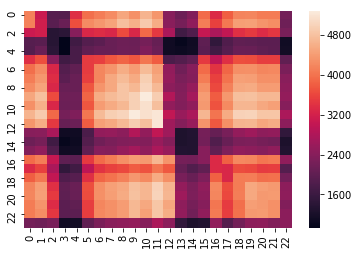

In [284]:
import seaborn as sns

sns.heatmap(df)

In [286]:
plot_df = pd.DataFrame(df.mean())

In [314]:
plot_df = pd.DataFrame(df.mean())
plot_df.columns = ['corr_mean']
plot_df['section'] = "Intro"
plot_df['min_time'] = 0
plot_df['max_time'] = 0
section_count = 0

section = 0

i_max = 0

for snippet in range(0,len(plot_df)-1):
    
    curr_snippet = plot_df.corr_mean[snippet]
    
    if snippet == 0:
        prev_snippet = curr_snippet
    else:
        prev_snippet = plot_df.corr_mean[snippet-1]  
    
    
    plot_df.min_time[snippet] = (snippet-1)*sr*20
    plot_df.max_time[snippet] = snippet*sr*20
    
    section_name = "Section_" + str(section+1)
    
    if np.abs((curr_snippet - prev_snippet) / prev_snippet) < 0.25:
        
        plot_df.section[snippet] = plot_df.section[snippet-1]
    
    else:

        plot_df.section[snippet] = section_name
        section+= 1
        
    if snippet == len(plot_df)-1:
        plot_df.section[snippet] = "outro"
    
    print(np.percentile(plot_df.corr_mean,0.9))
    plot_df.section[snippet] = np.where(plot_df.corr_mean[snippet] > np.percentile(plot_df.corr_mean,80), "Chorus", plot_df.section[snippet])
        

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


KeyError: -1

In [312]:
plot_df

,corr_mean,section,min_time,max_time
0,3562.374023,Intro,0,0
1,3655.112066,Intro,0,441000
2,2741.702993,Intro,441000,882000
3,1709.937930,Section_1,882000,1323000
4,1990.862050,Section_1,1323000,1764000
5,3213.762029,Section_2,1764000,2205000
6,3665.233882,Section_2,2205000,2646000
7,3791.219655,Section_2,2646000,3087000
8,3935.440074,Chorus,3087000,3528000
9,4006.827566,Chorus,3528000,3969000


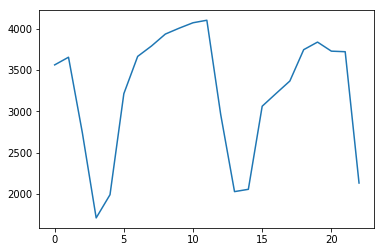

In [289]:
plt.plot(plot_df.corr_mean)

In [ ]:
p

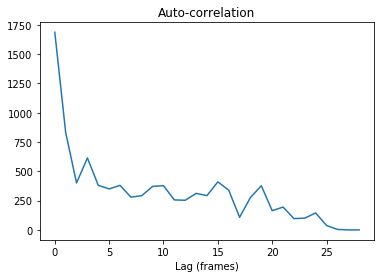

In [84]:
import matplotlib.pyplot as plt
odf = librosa.onset.onset_strength(y=y, sr=sr, hop_length = sr*9)
ac = librosa.autocorrelate(odf, max_size = sr*9)
plt.plot(ac)
plt.title('Auto-correlation')
plt.xlabel('Lag (frames)')
plt.show()

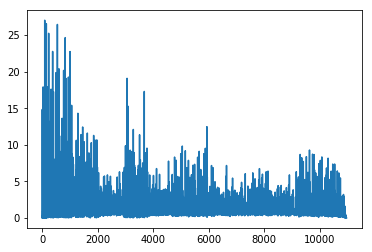

In [27]:
plt.plot(odf)

In [9]:
for song in Nirvana_music_list:
    src = str(nirvana_folder) + "/" + str(song)
    dst = str(nirvana_wav) + "/" + str(song)
    # convert mp3 to wav                                                        
    sound = AudioSegment.from_mp3(src)
    sound.export(dst, format="wav")

In [11]:


Band_data = pd.DataFrame()


for song in Nirvana_music_list:

    curr_track = str(nirvana_wav) + "/" + str(song)
    y, sr = librosa.load(curr_track)
    
    tempo, beats = librosa.beat.beat_track(y=y, sr=sr)
    
    seg_beats = beats[::8]

    for i in range(len(seg_beats)-1):
        start = int((len(y)/max(beats)) * seg_beats[i])
        end = int((len(y)/max(beats)) * seg_beats[i+1])
        segment = y[start:end]
        
        tempo_seg, beats_seg = librosa.beat.beat_track(y=segment, sr=sr)
        
        for j in range (len(beats_seg)-1):
            
            index_ = i*8 + j
            
            band = song.split(' - ')[0]
            Album = song.split(' - ')[1]
            track = song.split(' - ')[3].split('.')[0]
            
            try:
                track_tempo = tempo
            except:
                track_tempo = 0
                
            seg_num = int(i) * 8
            
            try:
                seg_length = seg_beats[i+1] - seg_beats[i]
            except:
                seg_length = 0
            
            try:
                seg_bpm = tempo_seg
            except:
                seg_bpm = 0
            
            beat_num = int(j)
             
            start = int((len(y)/max(beats)) * beats_seg[j])
            end = int((len(y)/max(beats)) * beats_seg[j+1])
            beat = y[start:end]
            try:
                chroma = librosa.feature.chroma_cqt(beat,sr)
            except:
                chroma = np.zeros(2)
                
            beat_features = chroma
                          
            df_list = [index_, band ,Album, track, track_tempo, seg_num, seg_length, seg_bpm, beat_num, beat_features]
            Band_data = Band_data.append(pd.Series(df_list),ignore_index=True)    

In [12]:
Band_data.columns = ['index_','Band','Album', 'track', 'track_tempo','seg_num','seg_length','seg_bpm','beat_num','beat_features']

In [13]:
Band_data['index__'] = Band_data['index_'].shift(-1)
Band_data['target_features'] = Band_data['beat_features'].shift(-1)

In [14]:
Band_data.shape

(22210, 12)

In [ ]:
#Band_data['target_diff'] = np.mean(np.abs(Band_data.beat_features[:, None] - Band_data.target_features))

In [15]:
Band_data.to_pickle("org_df.pkl")

In [10]:
Band_data.to_csv("org_df.csv")

In [ ]:
dummies_df = pd.get_dummies(df_cc_all_calls_prev_calls.fin_disp)
df_cc_all_calls_prev_calls = pd.concat([df_cc_all_calls_prev_calls, dummies_df], axis =1)

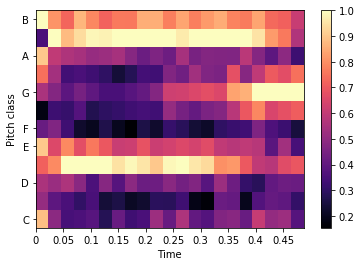

In [83]:
librosa.display.specshow(chroma, x_axis = 'time', y_axis = 'chroma')
plt.colorbar()

In [5]:
curr_song = str(nirvana_wav) + "/" + Nirvana_music_list[0]

y, sr = librosa.load(curr_song)

print(len(y),sr)

Audio(data = y, rate = sr)

3850812 22050


In [16]:
tempo, beats = librosa.beat.beat_track(y=y, sr=sr)

In [37]:
seg_beats = beats[::8]

In [77]:
max(beats)

7436

In [23]:
pitches, magnitudes = librosa.piptrack(y=y, sr=sr)

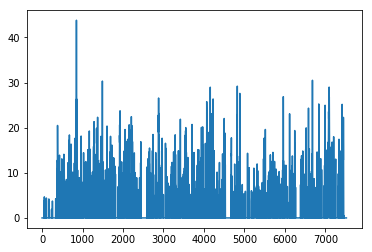

In [33]:
plt.plot(magnitudes[30])

In [28]:
magnitudes

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [6]:
decibel_limit = np.quantile(librosa.core.amplitude_to_db(y, ref=0), 0.03)

In [28]:
print(decibel_limit)

46.18778839111327


(array([  43651.,   10450.,   24230.,   56175.,  131069.,  320966.,
         767368., 1392749., 1017583.,   86571.]),
 array([ 20.358208,  28.358208,  36.358208,  44.358208,  52.358208,
         60.358208,  68.35821 ,  76.35821 ,  84.35821 ,  92.35821 ,
        100.35821 ], dtype=float32),
 <a list of 10 Patch objects>)

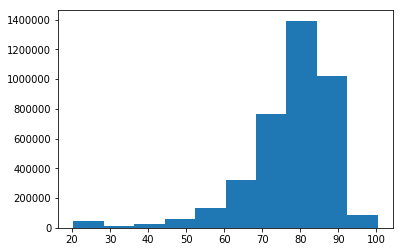

In [6]:
plt.hist(librosa.core.amplitude_to_db(y, ref=0))

(array([5.700000e+01, 1.882000e+03, 3.567700e+04, 2.889240e+05,
        1.402151e+06, 1.671066e+06, 3.953220e+05, 5.231600e+04,
        3.220000e+03, 1.970000e+02]),
 array([-1.0421027 , -0.8370717 , -0.63204074, -0.42700973, -0.22197874,
        -0.01694775,  0.18808325,  0.39311424,  0.59814525,  0.8031762 ,
         1.0082072 ], dtype=float32),
 <a list of 10 Patch objects>)

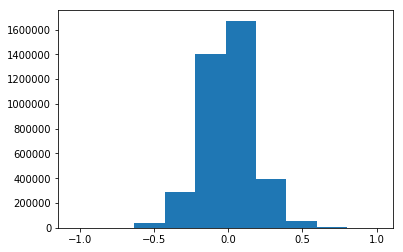

In [7]:
plt.hist(y)

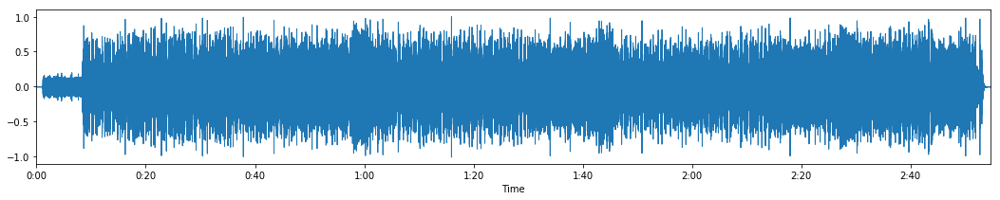

In [8]:
fig = plt.figure(figsize = (18,3))

ax = librosa.display.waveplot(y, sr)

In [726]:
files = librosa.effects.split(y, top_db = decibel_limit/15, frame_length=2048, ref = np.median,  hop_length=512)

In [727]:
x = []

for i in range(0,len(files)):
    x.append(np.append(files[i], files[i][1]-files[i][0]))

files = np.array(x)

file_data = pd.DataFrame(files)

limit = np.quantile(file_data[2], 0.99)

print(limit)

file_data = file_data.loc[file_data[2] > limit]

182538.24000000005


In [728]:
print(file_data)
files = np.array(file_data)

           0        1       2
151  1632768  1979904  347136
281  3075072  3323392  248320
283  3470848  3655680  184832
427  5672448  5937664  265216
429  5951488  6401024  449536


In [729]:
level_0_chunks = []

start_blank = 0
end_blank  = 0
start_n_blank = 0
end_n_blank = 0

for i in range(0,len(files)):
    if i == 0:
        start_blank = 0
        end_blank = files[i][0]
        start_n_blank = files[i][0]
        end_n_blank = files[i][1]
    else:
        start_blank = files[i-1][1]
        end_blank  = files[i][0]
        start_n_blank = files[i][0]
        end_n_blank = files[i][1]
    
    level_0_chunks.append(y[start_blank : end_blank])
    level_0_chunks.append(y[start_n_blank : end_n_blank])
    

In [736]:
Audio(data = level_0_chunks[2], rate = sr)

In [748]:
import gc
gc.collect()

13000

In [757]:
chroma = librosa.feature.chroma_cqt(level_0_chunks[2],sr)

In [75]:
chroma

NameError: name 'chroma' is not defined

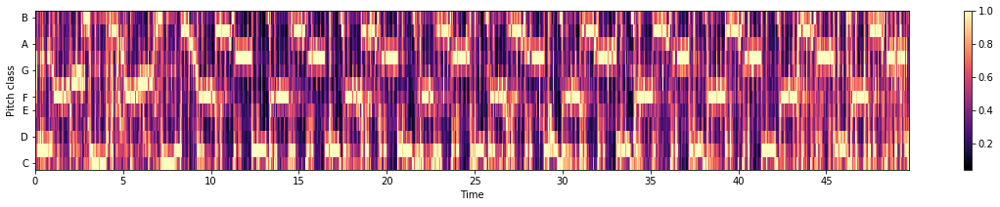

In [760]:
fig = plt.figure(figsize = (20,3))
librosa.display.specshow(chroma, x_axis = 'time', y_axis = 'chroma')
plt.colorbar()